In [1]:
import numpy as np
from tensorflow.keras.preprocessing.text import one_hot
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Embedding

reviews = ['nice food',
        'amazing restaurant',
        'too good',
        'just loved it!',
        'will go again',
        'horrible food',
        'never go there',
        'poor service',
        'poor quality',
        'needs improvement']

sentiment = np.array([1,1,1,1,1,0,0,0,0,0])

In [28]:
one_hot("amazing nice",30)

[27, 22]

In [8]:
vocab_size=30
encoded_reviews = [one_hot(d, vocab_size) for d in reviews]
print(encoded_reviews)

[[22, 27], [27, 2], [16, 17], [7, 25, 27], [3, 1, 3], [3, 27], [16, 1, 22], [27, 28], [27, 9], [26, 9]]


In [10]:
max_length = 3
padded_reviews = pad_sequences(encoded_reviews, maxlen=max_length, padding='post')
print(padded_reviews)

[[22 27  0]
 [27  2  0]
 [16 17  0]
 [ 7 25 27]
 [ 3  1  3]
 [ 3 27  0]
 [16  1 22]
 [27 28  0]
 [27  9  0]
 [26  9  0]]


In [14]:
embeded_vector_size = 4

model = Sequential()
model.add(Embedding(vocab_size, embeded_vector_size, input_length=max_length,name="embedding"))
model.add(Flatten())
model.add(Dense(1, activation='sigmoid'))

In [15]:
X = padded_reviews
y = sentiment

In [16]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 3, 4)              120       
                                                                 
 flatten_1 (Flatten)         (None, 12)                0         
                                                                 
 dense_1 (Dense)             (None, 1)                 13        
                                                                 
Total params: 133
Trainable params: 133
Non-trainable params: 0
_________________________________________________________________
None


In [17]:
model.fit(X, y, epochs=50, verbose=0)

In [18]:
# evaluate the model
loss, accuracy = model.evaluate(X, y)
accuracy

1/1 [==============================] - 0s 118ms/step - loss: 0.6415 - accuracy: 0.8000


0.800000011920929

In [27]:
 model.get_layer('embedding').get_weights()[0]

array([[ 0.03480098,  0.06272128, -0.00262702, -0.02356159],
       [ 0.00045738, -0.0365581 , -0.01707871, -0.05145342],
       [ 0.08317571, -0.02484581, -0.10527699, -0.0069595 ],
       [-0.07065896, -0.04721459, -0.03814973,  0.09516507],
       [-0.04297968, -0.00771059,  0.01010974, -0.00218054],
       [ 0.03887579,  0.02159766, -0.03186774, -0.01904962],
       [-0.01622046,  0.00389088,  0.01391223,  0.00705029],
       [ 0.05176765,  0.08367937,  0.06644273, -0.0272176 ],
       [-0.01610361, -0.03881593, -0.04428377,  0.00237272],
       [-0.06791502,  0.01861084,  0.06741467,  0.0495104 ],
       [ 0.04923214,  0.0126951 ,  0.02244176, -0.01245282],
       [-0.00273237,  0.02373892,  0.04240665,  0.02186734],
       [ 0.0328486 ,  0.023361  ,  0.01240052, -0.04990451],
       [-0.0338818 , -0.04931794, -0.01745412,  0.03828304],
       [-0.01093202,  0.02824255,  0.03976058,  0.01604389],
       [-0.01299227, -0.02638793,  0.04017531, -0.0037531 ],
       [-0.04839969,  0.

In [22]:
weights = model.get_layer('embedding').get_weights()[0]
len(weights)

30

In [30]:
weights[27]

array([-0.07055131, -0.02368908, -0.04884982,  0.01874519], dtype=float32)

In [29]:
weights[22]

array([ 0.01908192,  0.04713544,  0.09634852, -0.00150089], dtype=float32)

In [25]:
weights[16]

array([-0.04839969,  0.03749909, -0.05245733,  0.05767179], dtype=float32)

# Word2Vec

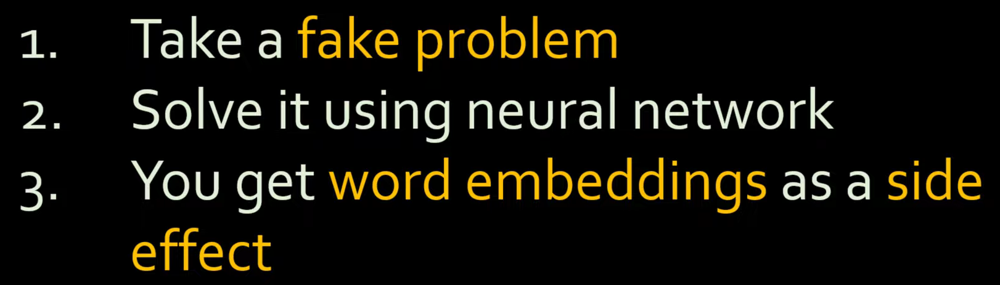

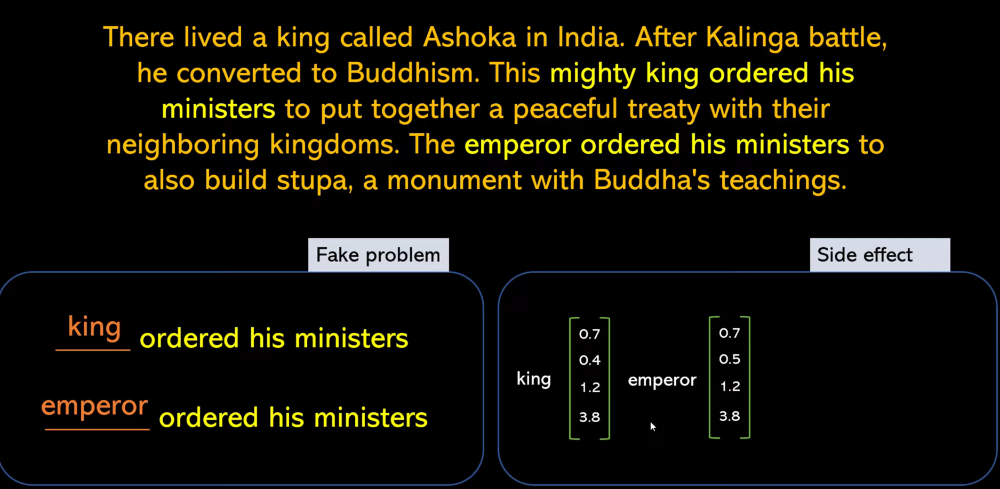

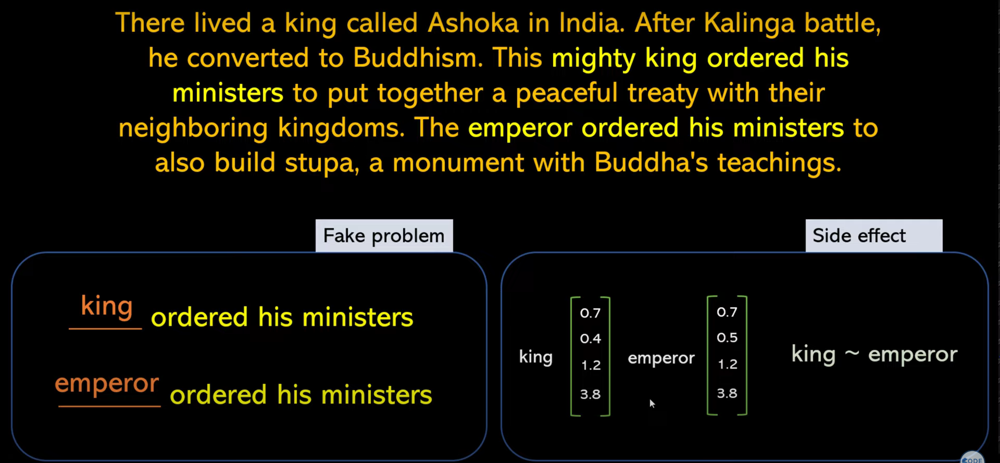

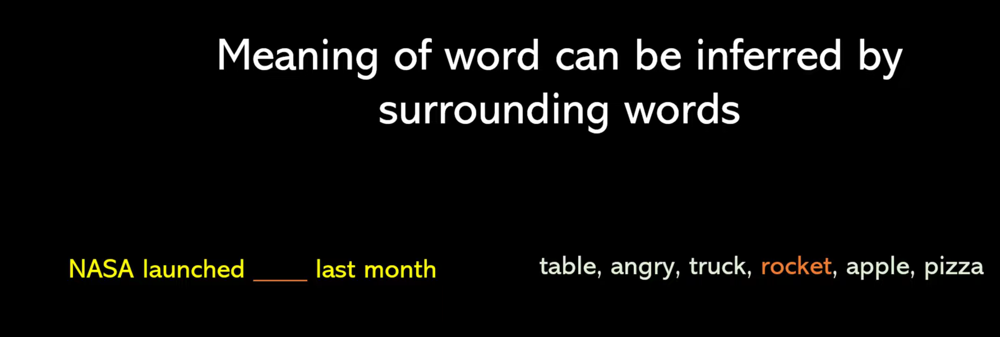

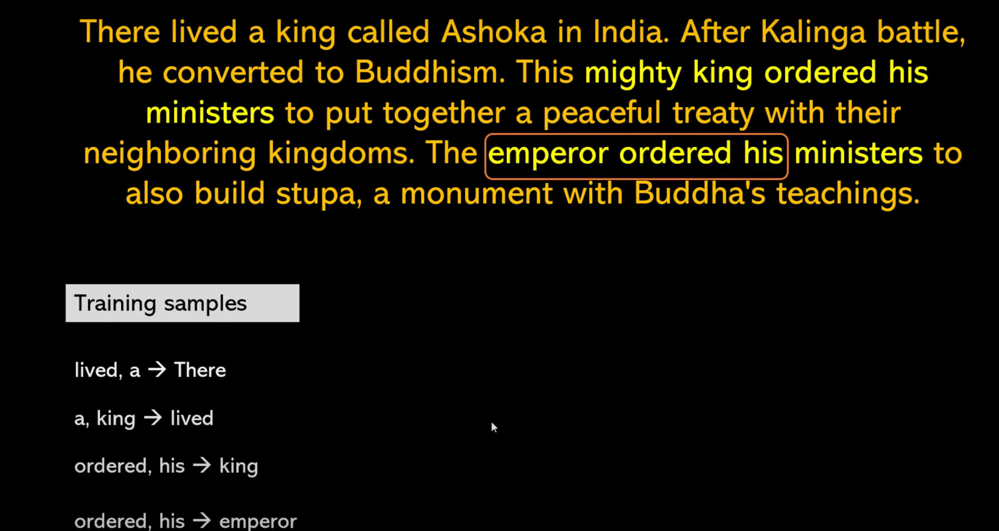

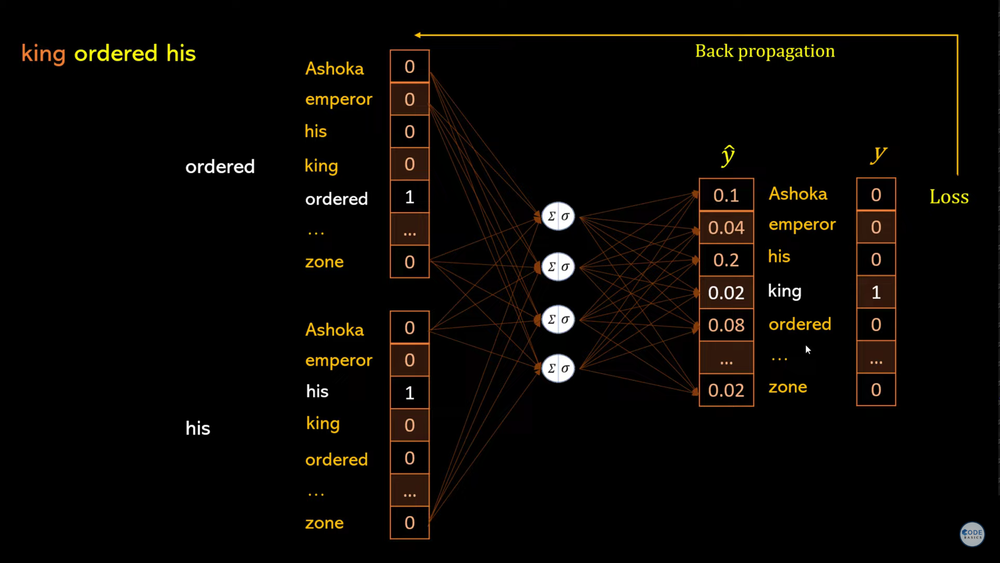

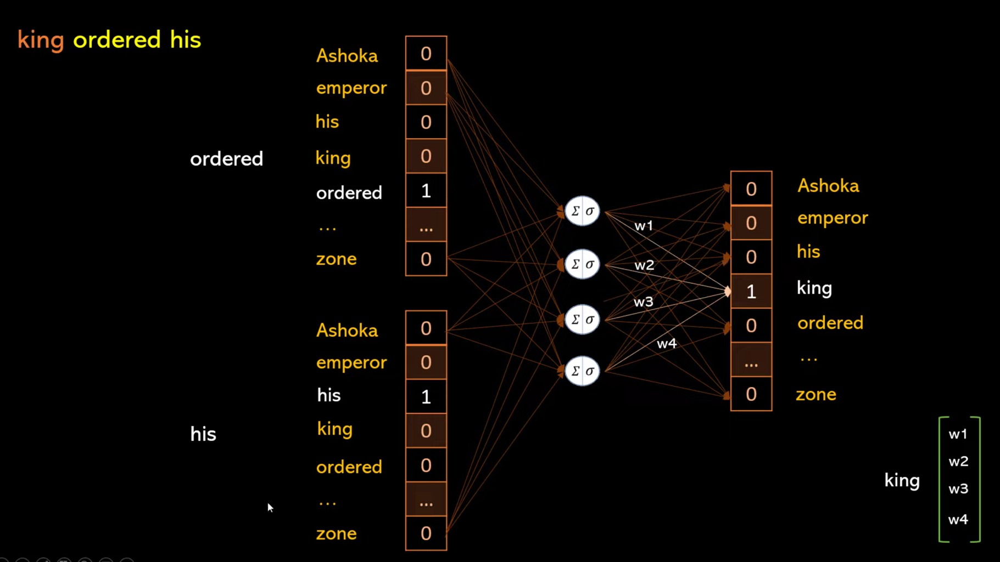

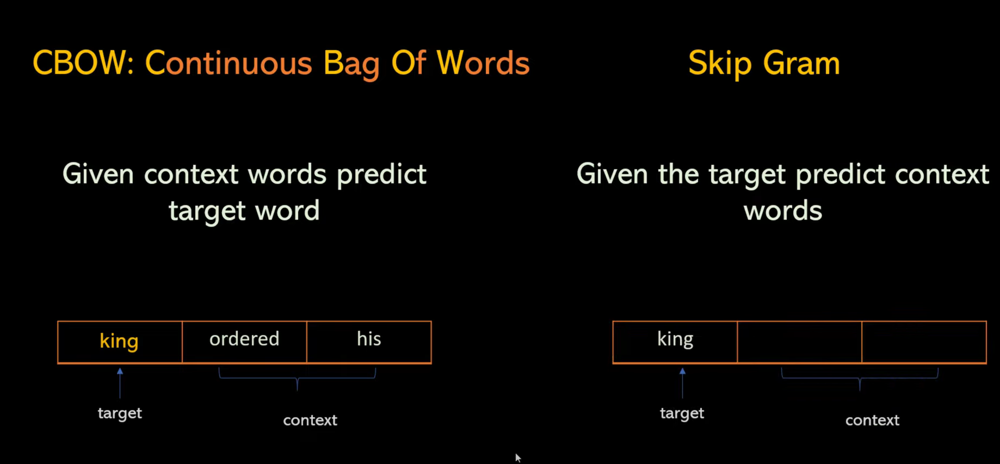

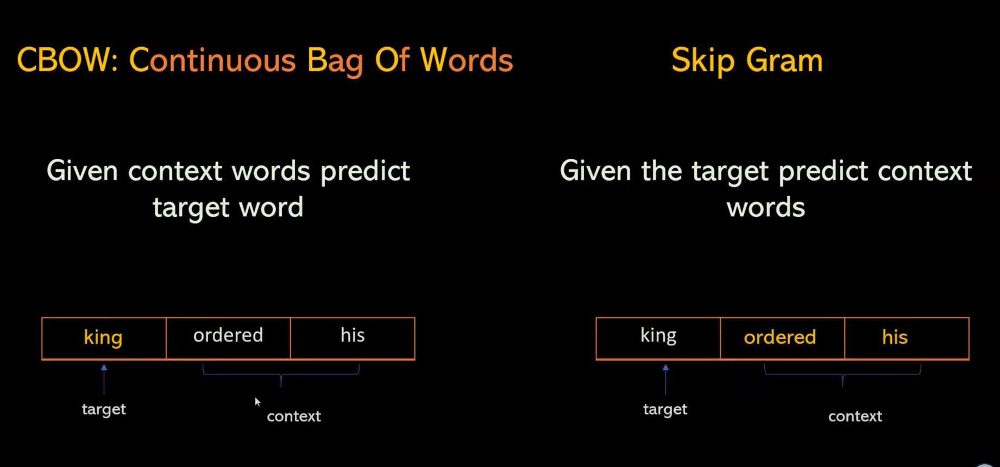

In [31]:
!pip install gensim
!pip install python-Levenshtein

Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 67.1/67.1 kB 1.2 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for fst-pso: filename=fst_pso-1.8.1-py3-none-any.whl size=20448 sha256=12d1aa9a357cd9b6a0edfb7ff25d2dc5f04c763f7b3f507640b028b7bf5e0962
  Stored in directory: c:\users\ayush\appdata\local\pip\cache\wheels\01\02\ee\df0699282986903a384b69aab4413af9efd26b3612b5dccc9e
  Created wheel for miniful: filename=miniful-0.0.6-py3-none-any.whl size=3522 sha256=6506b3aa4d13179826f87647f8fb70ff49c5f83b56128d6e9ec2627543627d3d
  Stored in directory: c:\users\ayush\appdata\local\pip\cache\wheels\43\aa\48\5c66b931ff013ad19774081aa19656637af5c0cc33b5494b30
Successfully built fst-pso miniful
Defaulting to user installation because no

In [32]:
import gensim
import pandas as pd

Reading and Exploring the Dataset
The dataset we are using here is a subset of Amazon reviews from the Cell Phones & Accessories category. The data is stored as a JSON file and can be read using pandas.

Link to the Dataset: http://snap.stanford.edu/data/amazon/productGraph/categoryFiles/reviews_Cell_Phones_and_Accessories_5.json.gz 

In [37]:
import pandas as pd
import gzip
import json

data = []
with gzip.open(r"C:\Users\Ayush\Downloads\reviews_Cell_Phones_and_Accessories_5.json.gz", "rb") as f:
    for line in f:
        json_data = json.loads(line.decode("utf-8"))
        data.append(json_data)

df = pd.DataFrame(data)
df

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A30TL5EWN6DFXT,120401325X,christina,"[0, 0]",They look good and stick good! I just don't li...,4.0,Looks Good,1400630400,"05 21, 2014"
1,ASY55RVNIL0UD,120401325X,emily l.,"[0, 0]",These stickers work like the review says they ...,5.0,Really great product.,1389657600,"01 14, 2014"
2,A2TMXE2AFO7ONB,120401325X,Erica,"[0, 0]",These are awesome and make my phone look so st...,5.0,LOVE LOVE LOVE,1403740800,"06 26, 2014"
3,AWJ0WZQYMYFQ4,120401325X,JM,"[4, 4]",Item arrived in great time and was in perfect ...,4.0,Cute!,1382313600,"10 21, 2013"
4,ATX7CZYFXI1KW,120401325X,patrice m rogoza,"[2, 3]","awesome! stays on, and looks great. can be use...",5.0,leopard home button sticker for iphone 4s,1359849600,"02 3, 2013"
...,...,...,...,...,...,...,...,...,...
194434,A1YMNTFLNDYQ1F,B00LORXVUE,eyeused2loveher,"[0, 0]",Works great just like my original one. I reall...,5.0,This works just perfect!,1405900800,"07 21, 2014"
194435,A15TX8B2L8B20S,B00LORXVUE,Jon Davidson,"[0, 0]",Great product. Great packaging. High quality a...,5.0,Great replacement cable. Apple certified,1405900800,"07 21, 2014"
194436,A3JI7QRZO1QG8X,B00LORXVUE,Joyce M. Davidson,"[0, 0]","This is a great cable, just as good as the mor...",5.0,Real quality,1405900800,"07 21, 2014"
194437,A1NHB2VC68YQNM,B00LORXVUE,Nurse Farrugia,"[0, 0]",I really like it becasue it works well with my...,5.0,I really like it becasue it works well with my...,1405814400,"07 20, 2014"


line.decode("utf-8"): The decode method is used to convert the sequence of bytes (line) into a string using UTF-8 encoding. This is necessary because JSON data is typically represented as strings.

In [38]:
df.shape

(194439, 9)

# Simple Preprocessing & Tokenization

The first thing to do for any data science task is to clean the data. For NLP, we apply various processing like converting all the words to lower case, trimming spaces, removing punctuations. This is something we will do over here too.

Additionally, we can also remove stop words like 'and', 'or', 'is', 'the', 'a', 'an' and convert words to their root forms like 'running' to 'run'.

In [39]:
df.reviewText

0         They look good and stick good! I just don't li...
1         These stickers work like the review says they ...
2         These are awesome and make my phone look so st...
3         Item arrived in great time and was in perfect ...
4         awesome! stays on, and looks great. can be use...
                                ...                        
194434    Works great just like my original one. I reall...
194435    Great product. Great packaging. High quality a...
194436    This is a great cable, just as good as the mor...
194437    I really like it becasue it works well with my...
194438    product as described, I have wasted a lot of m...
Name: reviewText, Length: 194439, dtype: object

In [40]:
review_text = df.reviewText.apply(gensim.utils.simple_preprocess)
review_text

0         [they, look, good, and, stick, good, just, don...
1         [these, stickers, work, like, the, review, say...
2         [these, are, awesome, and, make, my, phone, lo...
3         [item, arrived, in, great, time, and, was, in,...
4         [awesome, stays, on, and, looks, great, can, b...
                                ...                        
194434    [works, great, just, like, my, original, one, ...
194435    [great, product, great, packaging, high, quali...
194436    [this, is, great, cable, just, as, good, as, t...
194437    [really, like, it, becasue, it, works, well, w...
194438    [product, as, described, have, wasted, lot, of...
Name: reviewText, Length: 194439, dtype: object

In [41]:
review_text.loc[0]

['they',
 'look',
 'good',
 'and',
 'stick',
 'good',
 'just',
 'don',
 'like',
 'the',
 'rounded',
 'shape',
 'because',
 'was',
 'always',
 'bumping',
 'it',
 'and',
 'siri',
 'kept',
 'popping',
 'up',
 'and',
 'it',
 'was',
 'irritating',
 'just',
 'won',
 'buy',
 'product',
 'like',
 'this',
 'again']

# Training the Word2Vec Model

Train the model for reviews. Use a window of size 10 i.e. 10 words before the present word and 10 words ahead. A sentence with at least 2 words should only be considered, configure this using min_count parameter.

Workers define how many CPU threads to be used.

# Initialize the model

In [43]:
model = gensim.models.Word2Vec(
        window=10,
        min_count=2,
        workers=4
)

# Build Vocabulary

In [44]:
model.build_vocab(review_text,progress_per=1000)

In [45]:
model.epochs

5

# Train the Word2Vec Model

In [46]:
model.train(review_text, total_examples=model.corpus_count, epochs=model.epochs)

(61509272, 83868975)

# Save the Model

Save the model so that it can be reused in other applications

In [47]:
model.save("./word2vec-amazon-cell-accessories-reviews-short.model")

# Finding Similar Words and Similarity between words

In [48]:
model.wv.most_similar("bad")

[('shabby', 0.6936348080635071),
 ('terrible', 0.6681477427482605),
 ('good', 0.5838556289672852),
 ('horrible', 0.5678077340126038),
 ('okay', 0.5207520127296448),
 ('poor', 0.5192328095436096),
 ('awful', 0.5153275728225708),
 ('legit', 0.5111488103866577),
 ('keen', 0.5095517635345459),
 ('sad', 0.5023486614227295)]

In [49]:
model.wv.similarity(w1="cheap", w2="inexpensive")

0.52606314

In [50]:
model.wv.similarity(w1="great", w2="good")

0.77727324

Further Reading
You can read about gensim more at https://radimrehurek.com/gensim/models/word2vec.html

Explore other Datasets related to Amazon Reviews: http://jmcauley.ucsd.edu/data/amazon/

Exercise
Train a word2vec model on the Sports & Outdoors Reviews Dataset Once you train a model on this, find the words most similar to 'awful' and find similarities between the following word tuples: ('good', 'great'), ('slow','steady')

Click here for solution.

# Small Image Classification Using Simple Aritifical Neural Network: GPU Benchmarking

In [51]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="4"

In [52]:
import tensorflow as tf
from tensorflow import keras
import numpy as np

# This command shows list of physical devices available for tensorflow. You can see GPU listed here. If you have NVIDIA GPU you need to install CUDA toolkit and cuDNN as per instruction on this webpage. Without proper installation you will not see GPU in list of devices

https://shawnhymel.com/1961/how-to-install-tensorflow-with-gpu-support-on-windows/

In [53]:
tf.config.experimental.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]

In [54]:
tf.__version__

'2.10.0'

In [55]:
tf.test.is_built_with_cuda()

False

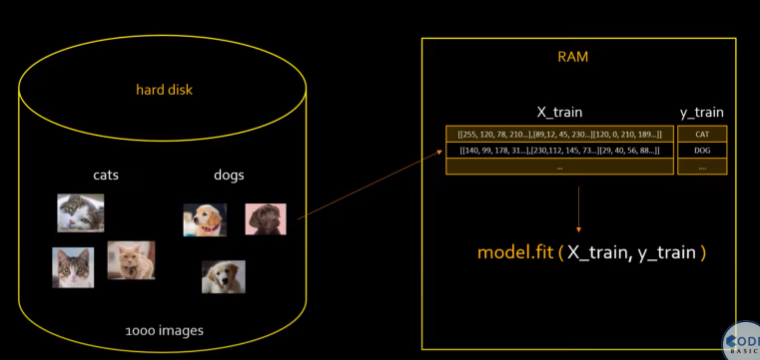

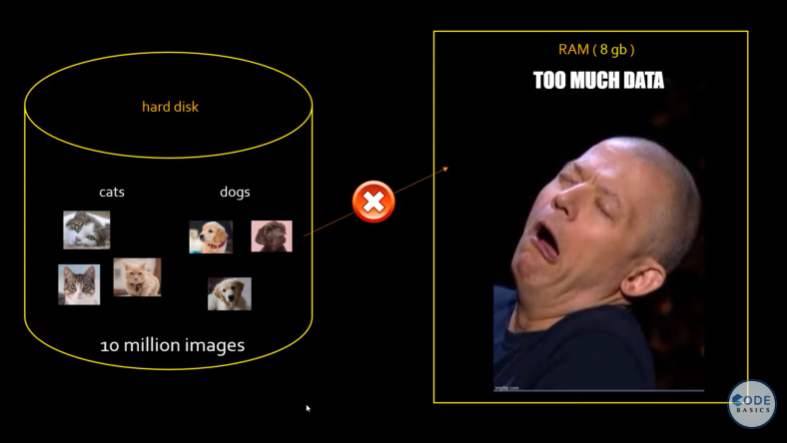

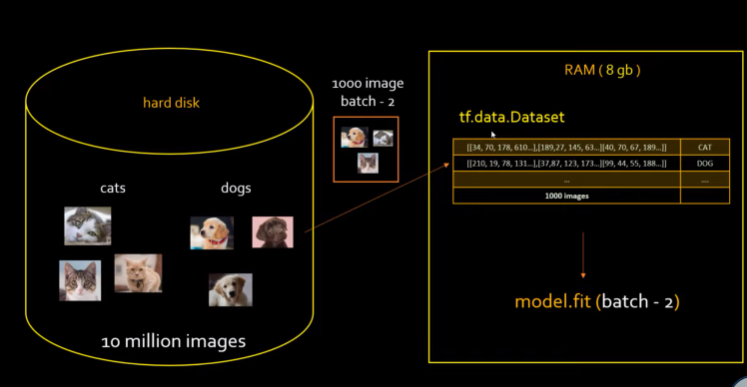

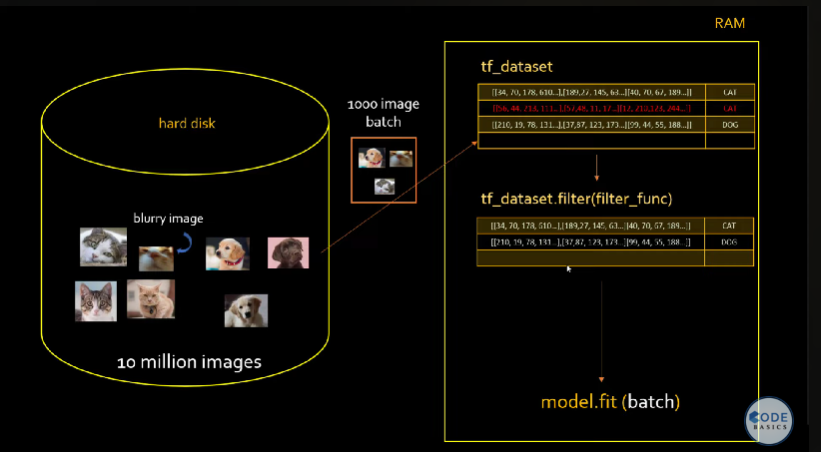

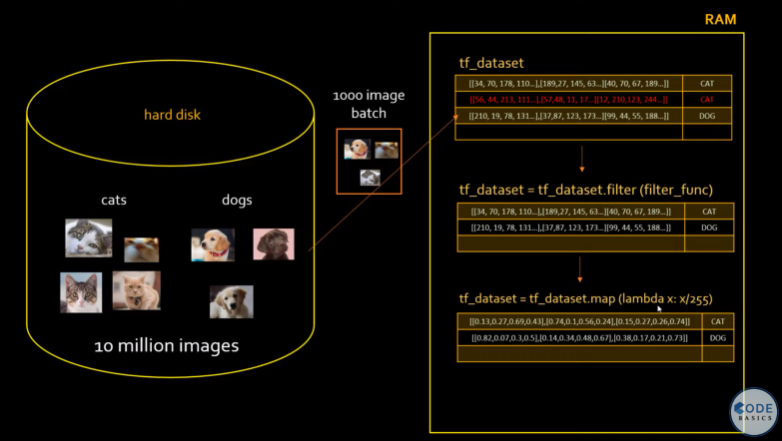

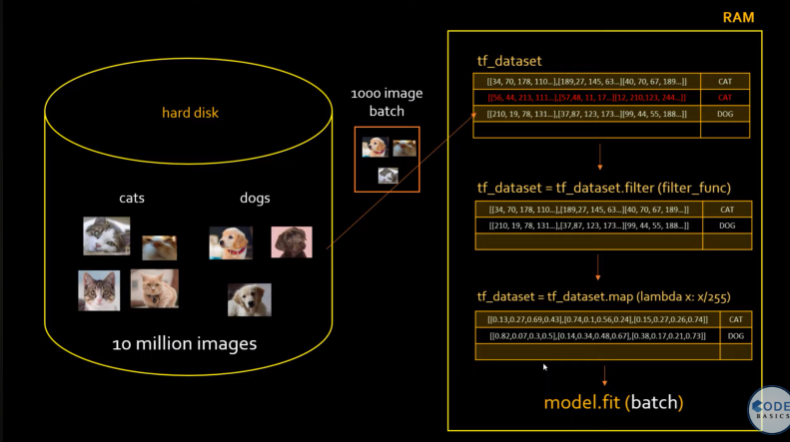

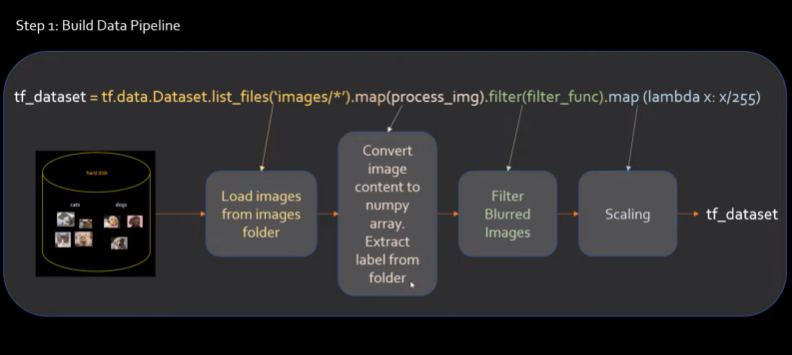

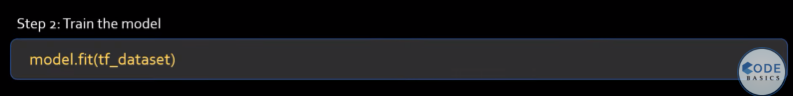

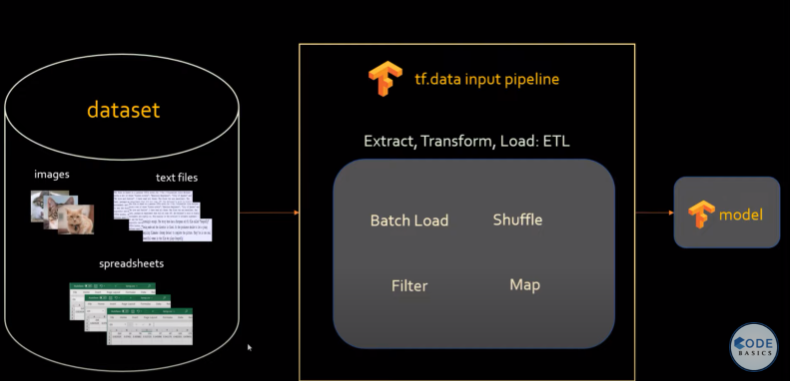

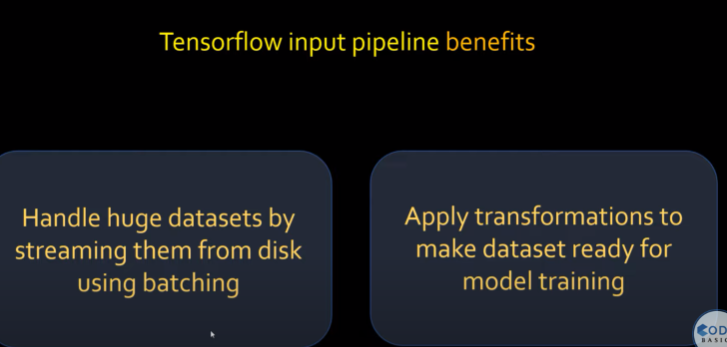

In [56]:
import tensorflow as tf

# Create tf dataset from a list

In [57]:
daily_sales_numbers = [21, 22, -108, 31, -1, 32, 34,31]

tf_dataset = tf.data.Dataset.from_tensor_slices(daily_sales_numbers)
tf_dataset

<TensorSliceDataset element_spec=TensorSpec(shape=(), dtype=tf.int32, name=None)>

# Iterate through tf dataset

In [58]:
for sales in tf_dataset:
    print(sales.numpy())

21
22
-108
31
-1
32
34
31


In [59]:
for sales in tf_dataset.as_numpy_iterator():
    print(sales)

21
22
-108
31
-1
32
34
31


In [60]:
for sales in tf_dataset.take(3):
    print(sales.numpy())

21
22
-108


# Filter sales numbers that are < 0


In [61]:
tf_dataset = tf_dataset.filter(lambda x: x>0)
for sales in tf_dataset.as_numpy_iterator():
    print(sales)

21
22
31
32
34
31


# Convert sales numbers from USA dollars ($) to Indian Rupees (INR) Assuming 1->72 conversation rate

In [62]:
tf_dataset = tf_dataset.map(lambda x: x*72)
for sales in tf_dataset.as_numpy_iterator():
    print(sales)

1512
1584
2232
2304
2448
2232


# Shuffle

In [63]:
tf_dataset = tf_dataset.shuffle(2)
for sales in tf_dataset.as_numpy_iterator():
    print(sales)

1512
2232
1584
2304
2448
2232


https://stackoverflow.com/questions/53514495/what-does-batch-repeat-and-shuffle-do-with-tensorflow-dataset

# Batching

In [64]:
for sales_batch in tf_dataset.batch(2):
    print(sales_batch.numpy())

[1584 2232]
[2304 1512]
[2448 2232]


In [65]:
for sales_batch in tf_dataset.batch(4):
    print(sales_batch.numpy())

[1512 2232 2304 2448]
[1584 2232]


Perform all of the above operations in one shot

In [66]:
tf_dataset = tf.data.Dataset.from_tensor_slices(daily_sales_numbers)

tf_dataset = tf_dataset.filter(lambda x: x>0).map(lambda y: y*72).shuffle(2).batch(2)
for sales in tf_dataset.as_numpy_iterator():
    print(sales)

[1512 2232]
[1584 2304]
[2232 2448]


# Images

In [68]:
images_ds = tf.data.Dataset.list_files(r"C:\Users\Ayush\OneDrive\Pictures\Screenshots", shuffle=False)

In [69]:
image_count = len(images_ds)
image_count

1

In [70]:
for file in images_ds.take(3):
    print(file.numpy())

b'C:\\Users\\Ayush\\OneDrive\\Pictures\\Screenshots'


In [71]:
type(images_ds)

tensorflow.python.data.ops.dataset_ops.TensorSliceDataset

In [72]:
images_ds = images_ds.shuffle(200)
for file in images_ds.take(3):
    print(file.numpy())

b'C:\\Users\\Ayush\\OneDrive\\Pictures\\Screenshots'


In [73]:
class_names = ["cat","dog"]

In [74]:
train_size = int(image_count*0.8)
train_ds = images_ds.take(train_size)
test_ds = images_ds.skip(train_size)

In [75]:
len(train_ds)

0

In [76]:
len(test_ds)

1

In [77]:
def get_label(file_path):
    import os
    parts = tf.strings.split(file_path, os.path.sep)
    return parts[-2]

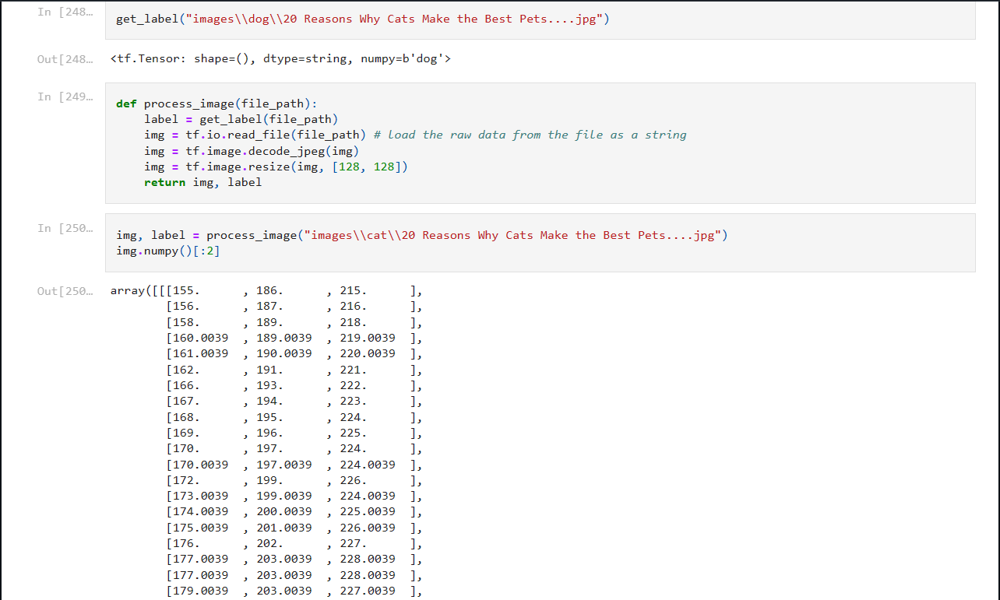

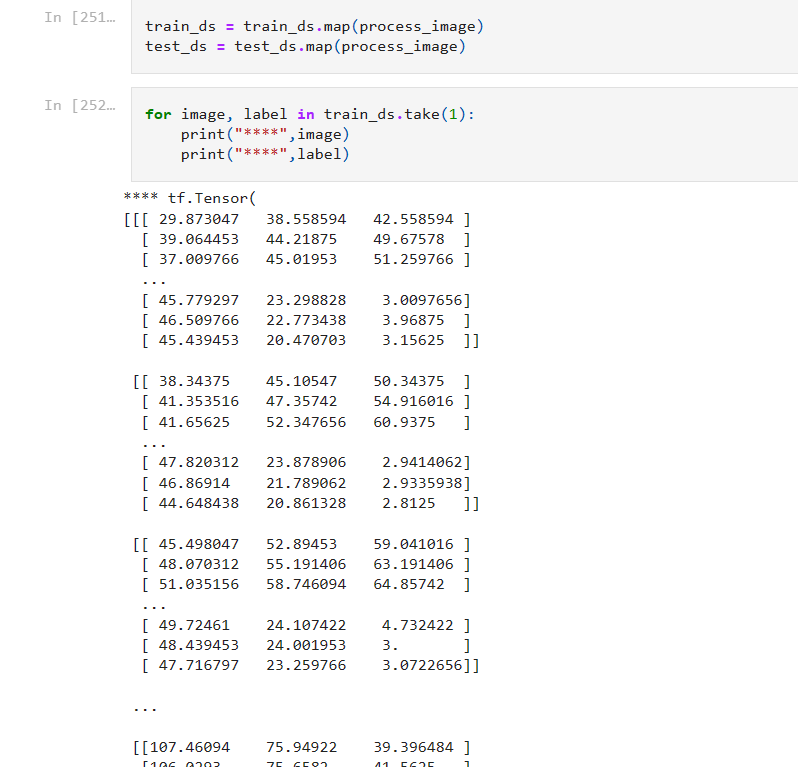

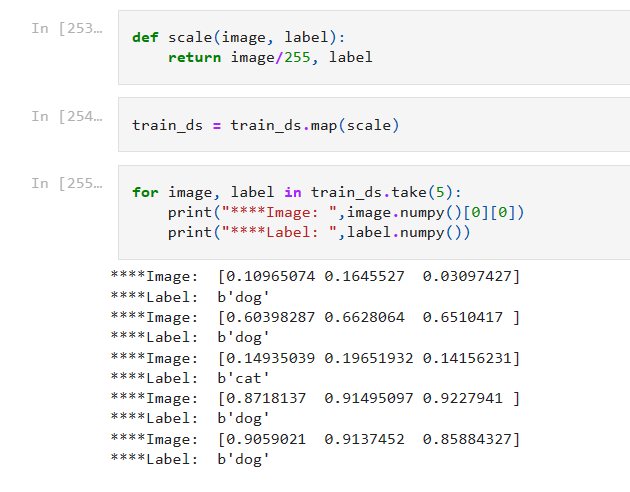

This is done because of unavailability of image datasets.

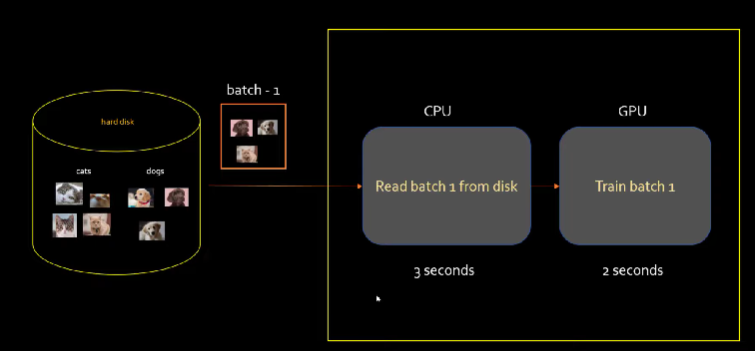

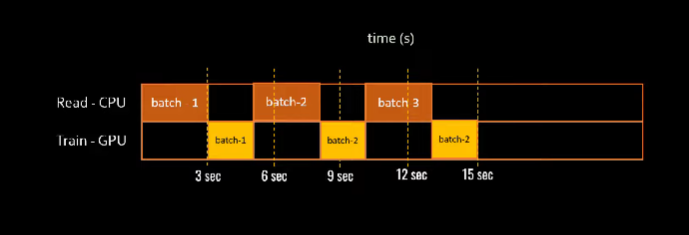

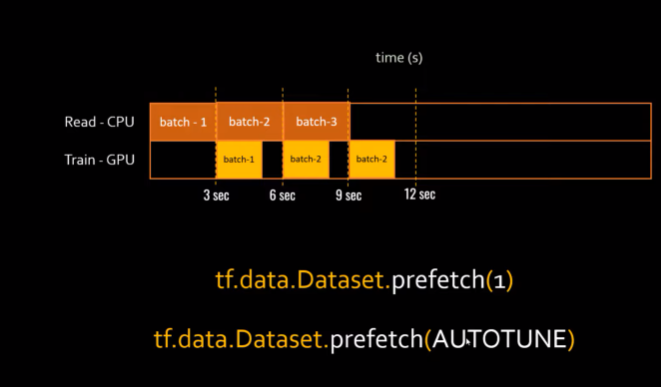

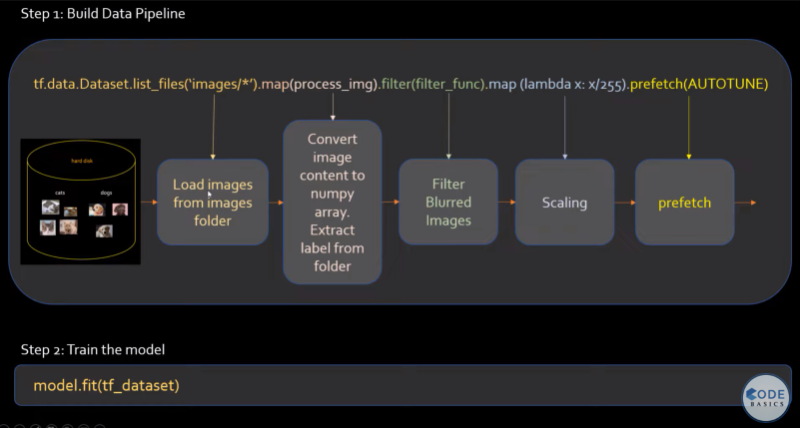

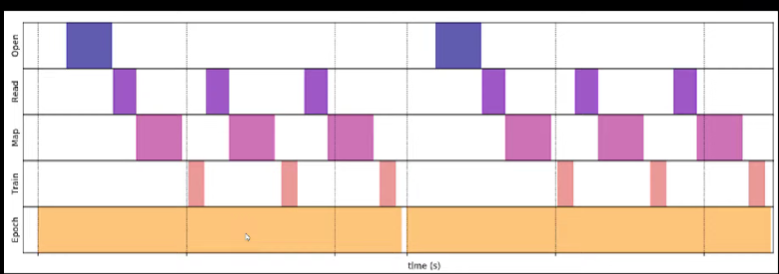

# 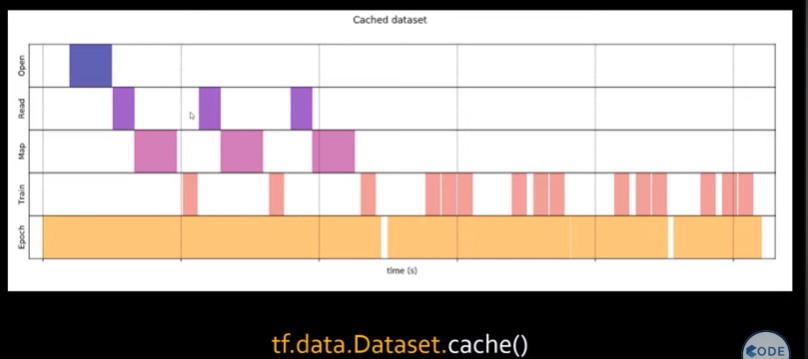

# Optimize tensorflow pipeline performance with prefetch and caching

In [78]:
import tensorflow as tf
import time

In [79]:
tf.__version__

'2.10.0'

# Prefetch

In [80]:
class FileDataset(tf.data.Dataset):
    def read_file_in_batches(num_samples):
        # Opening the file
        time.sleep(0.03)

        for sample_idx in range(num_samples):
            # Reading data (line, record) from the file
            time.sleep(0.015)

            yield (sample_idx,)

    def __new__(cls, num_samples=3):
        return tf.data.Dataset.from_generator(
            cls.read_file_in_batches,
            output_signature = tf.TensorSpec(shape = (1,), dtype = tf.int64),
            args=(num_samples,)
        )

In [81]:
def benchmark(dataset, num_epochs=2):
    for epoch_num in range(num_epochs):
        for sample in dataset:
            # Performing a training step
            time.sleep(0.01)

In [82]:
%%timeit
benchmark(FileDataset())

358 ms ± 23 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [83]:
%%timeit
benchmark(FileDataset().prefetch(1))

306 ms ± 9.48 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [84]:
%%timeit
benchmark(FileDataset().prefetch(tf.data.AUTOTUNE))

282 ms ± 15.2 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


As you can notice above, using prefetch improves the performance from 304 ms to 238 and 240 ms

# Cache

In [85]:
dataset = tf.data.Dataset.range(5)
dataset = dataset.map(lambda x: x**2)
dataset = dataset.cache("mycache.txt")
# The first time reading through the data will generate the data using
# `range` and `map`.
list(dataset.as_numpy_iterator())

[0, 1, 4, 9, 16]

In [86]:
# Subsequent iterations read from the cache.
list(dataset.as_numpy_iterator())

[0, 1, 4, 9, 16]

In [87]:
def mapped_function(s):
    # Do some hard pre-processing
    tf.py_function(lambda: time.sleep(0.03), [], ())
    return s

In [88]:
%%timeit -r1 -n1
benchmark(FileDataset().map(mapped_function), 5)

1.55 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


In [89]:
%%timeit -r1 -n1
benchmark(FileDataset().map(mapped_function).cache(), 5)

519 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


Further reading https://www.tensorflow.org/guide/data_performance#caching

# BERT

What is BERT (Bidirectional Encoder Representations From Transformers) and how it is used to solve NLP tasks? This video provides a very simple explanation of it. I am not going to go in details of how transformer based architecture works etc but instead I will go over an overview where you understand the usage of BERT in NLP tasks. In coding section we will generate sentence and word embeddings using BERT for some sample text.

We will cover various topics such as,
* Word2vec vc BERT
* How BERT is trained on masked language model and next sentence completion task

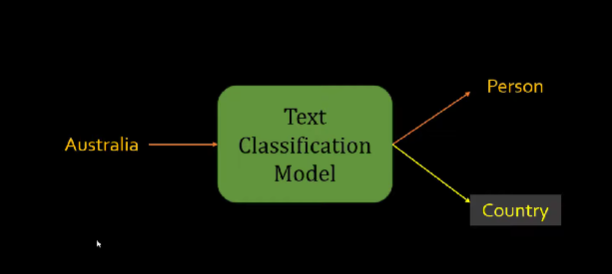

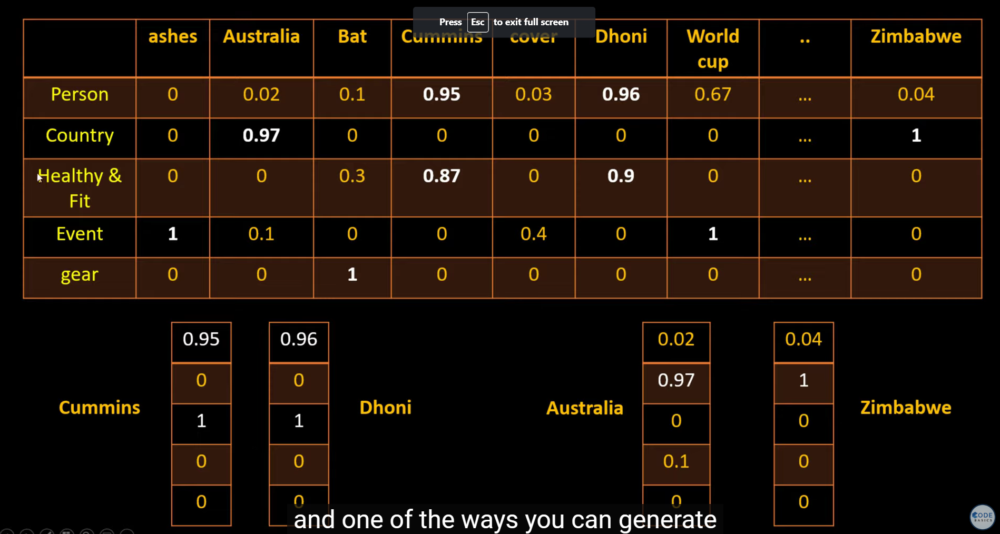

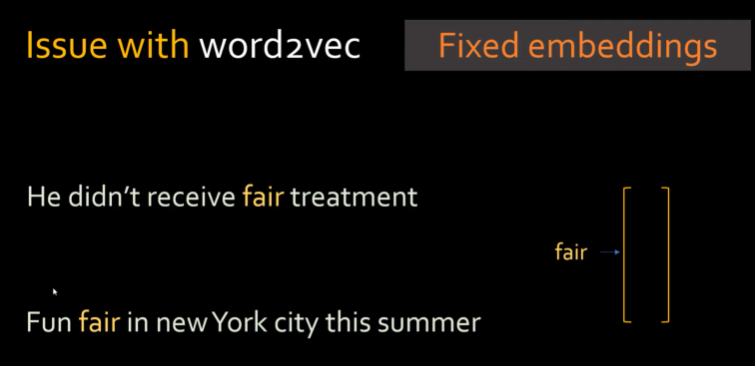

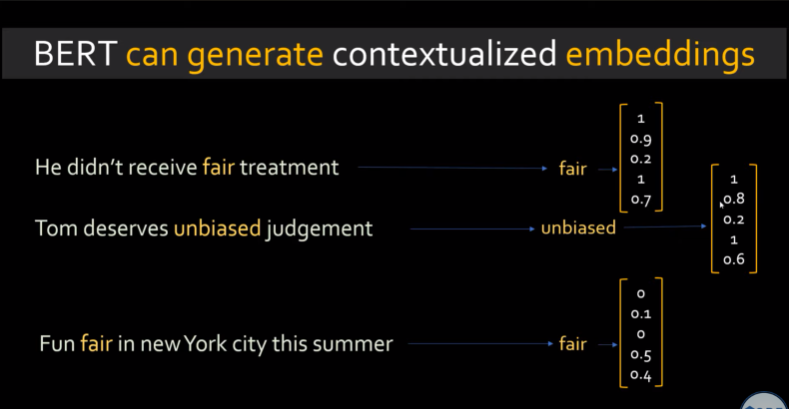

 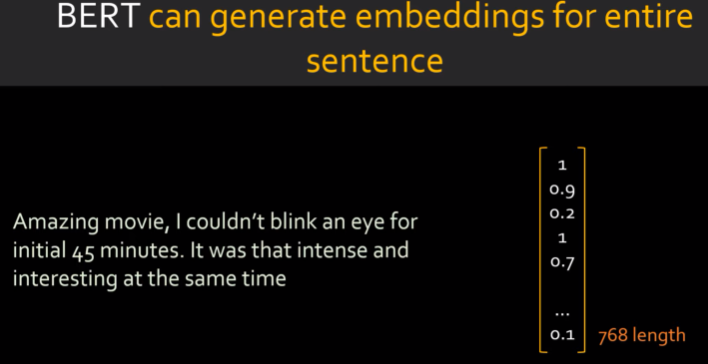

Here is the page that has list of all available bert models on tensorflow hub that one can download and make use of.

https://tfhub.dev/google/collections/bert/1

Here is the information on basic uncased BERT model,

https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4

It uses L=12 hidden layers (i.e., Transformer blocks), a hidden size of H=768, and A=12 attention heads. This model has been pre-trained for English on the Wikipedia and BooksCorpus.

import tensorflow_hub 

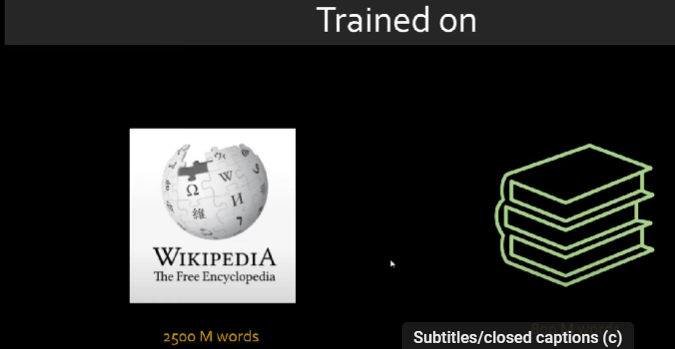

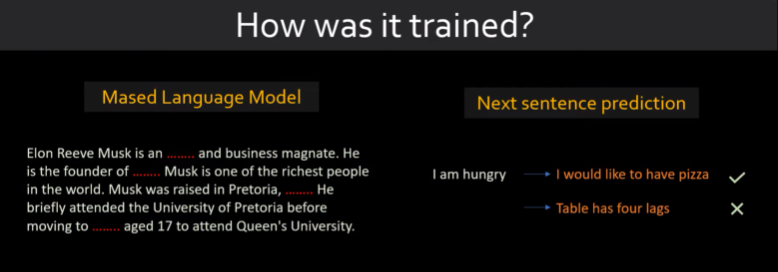

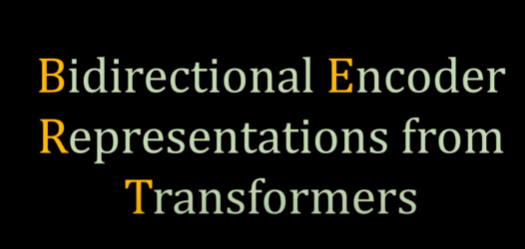

In [93]:
pip install tensorflow-text


Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 5.0/5.0 MB 3.6 MB/s eta 0:00:00
     -------------------------------------- 895.7/895.7 kB 6.3 MB/s eta 0:00:00
     ---------------------------------------- 1.5/1.5 MB 5.3 MB/s eta 0:00:00
     ---------------------------------------- 24.4/24.4 MB 3.8 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [95]:
import tensorflow_hub as hub
import tensorflow_text as text

In [92]:
preprocess_url = "https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3"
encoder_url = "https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4"

In [96]:
bert_preprocess_model = hub.KerasLayer(preprocess_url)

In [97]:
text_test = ['nice movie indeed','I love python programming']
text_preprocessed = bert_preprocess_model(text_test)
text_preprocessed.keys()

dict_keys(['input_mask', 'input_type_ids', 'input_word_ids'])

In [98]:
text_preprocessed['input_mask']

<tf.Tensor: shape=(2, 128), dtype=int32, numpy=
array([[1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])>

In [99]:
text_preprocessed['input_type_ids']

<tf.Tensor: shape=(2, 128), dtype=int32, numpy=
array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])>

In [100]:
text_preprocessed['input_word_ids']

<tf.Tensor: shape=(2, 128), dtype=int32, numpy=
array([[  101,  3835,  3185,  5262,   102,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0, 

101 --> CLS token

102 --> SEP token

BERT uses CLS as a special token at the begining of each setence whereas SEP as a special token to separate two sentences or end sinle sentece

In [114]:
bert_model = hub.KerasLayer(encoder_url)

In [115]:
bert_results = bert_model(text_preprocessed)

In [116]:
bert_results.keys()

dict_keys(['default', 'encoder_outputs', 'pooled_output', 'sequence_output'])

In [117]:
bert_results['sequence_output']

<tf.Tensor: shape=(2, 128, 768), dtype=float32, numpy=
array([[[ 0.07292049,  0.08567832,  0.14476843, ..., -0.09677091,
          0.08722125,  0.07711094],
        [ 0.17839369, -0.19006068,  0.50349426, ..., -0.05869869,
          0.32717082, -0.15578516],
        [ 0.18701461, -0.43388787, -0.48875186, ..., -0.155028  ,
          0.0014519 , -0.24470936],
        ...,
        [ 0.12083092,  0.12884223,  0.46453536, ...,  0.07375533,
          0.17441978,  0.16522057],
        [ 0.07967845, -0.01190702,  0.50225425, ...,  0.13777739,
          0.21002218,  0.00624612],
        [-0.07212667, -0.28303447,  0.5903332 , ...,  0.47551936,
          0.16668479, -0.08920354]],

       [[-0.07900572,  0.3633511 , -0.21101584, ..., -0.17183758,
          0.16299728,  0.67242694],
        [ 0.27883556,  0.43716273, -0.35764802, ..., -0.04463669,
          0.38315186,  0.5887989 ],
        [ 1.2037673 ,  1.0727017 ,  0.48408803, ...,  0.24921006,
          0.40730911,  0.4048186 ],
        ...,

In [118]:
len(bert_results['encoder_outputs'])

12

Since we are using BERT base model it has 12 encoder layers, that's why above the length of encoder_output is 12. Read more about purpose of each element here: https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4

You can see below that last element of encoder_outputs is basically a sequence_output

In [119]:
bert_results['encoder_outputs'][-1] == bert_results['sequence_output']

<tf.Tensor: shape=(2, 128, 768), dtype=bool, numpy=
array([[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],

       [[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]]])>

In [120]:
bert_results['encoder_outputs']

[<tf.Tensor: shape=(2, 128, 768), dtype=float32, numpy=
 array([[[ 0.12901434,  0.00644752, -0.03614967, ...,  0.04999617,
           0.06149189, -0.02657537],
         [ 1.1753381 ,  1.2140787 ,  1.1569982 , ...,  0.11634369,
          -0.35855362, -0.4049018 ],
         [ 0.03859029,  0.53869987, -0.21089774, ...,  0.21858206,
           0.7260167 , -1.1158605 ],
         ...,
         [-0.0758702 , -0.25421923,  0.7075514 , ...,  0.50541997,
          -0.1887868 ,  0.15028346],
         [-0.16066602, -0.2808968 ,  0.57597095, ...,  0.5275854 ,
          -0.11141375,  0.02887547],
         [-0.04428161, -0.20279582,  0.5909356 , ...,  0.8133834 ,
          -0.390758  , -0.02601738]],
 
        [[ 0.1890358 ,  0.02752552, -0.06513742, ..., -0.00620212,
           0.15053894,  0.03165442],
         [ 0.5916148 ,  0.75891393, -0.07240656, ...,  0.6190399 ,
           0.82928896,  0.16161975],
         [ 1.4460828 ,  0.44602647,  0.40990278, ...,  0.48255903,
           0.62691146,  0.13

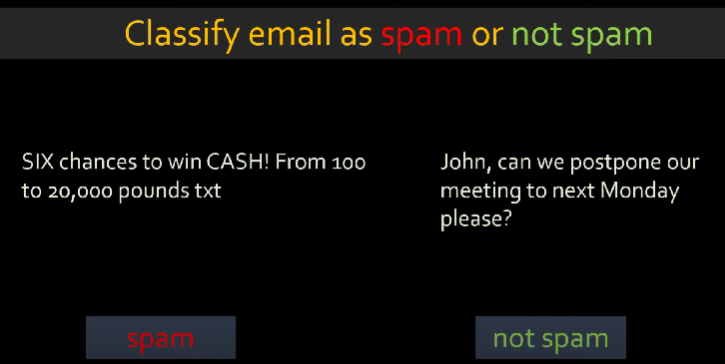

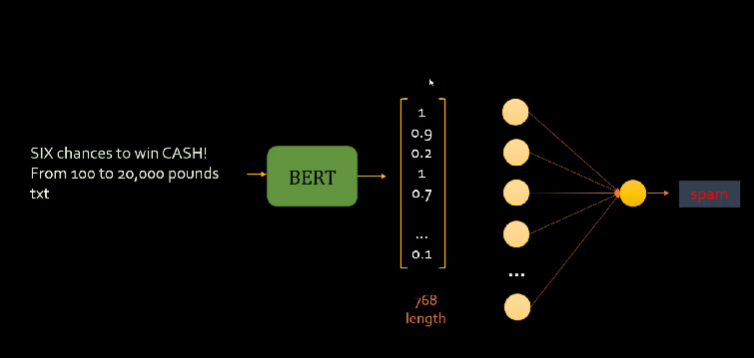

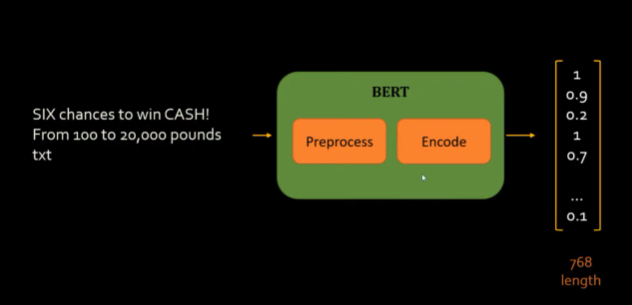

In [122]:
import pandas as pd

df=pd.read_csv(r"C:\Users\Ayush\Downloads\spamsmaster.csv")
df.head(5)

,ham\tGo until jurong point,crazy.. Available only in bugis n great world la e buffet... Cine there got amore wat...,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13
0,ham\tOk lar... Joking wif u oni...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,spam\tFree entry in 2 a wkly comp to win FA Cu...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ham\tU dun say so early hor... U c already the...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ham\tNah I don't think he goes to usf,he lives around here though,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,spam\tFreeMsg Hey there darling it's been 3 we...,£1.50 to rcv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


https://www.youtube.com/redirect?event=video_description&redir_token=QUFFLUhqbjZFZGJ4V2J2VHdpOHZYTDRTbGQteVl5eWZTUXxBQ3Jtc0ttN05DVXRRajFyY2xFd2NwR3dZNnZtYkpac2xXdmE2WENEZWlXSU9GTHg5M0NrVWp4Qk9ncTNlbE82OE52Q1gyTDlQWFo0Q1dOWjRNQmhqUnRadE5Sb2RrUkhMNWhpTkVqaDU2ZTF1TlkyemVaTG9DYw&q=https%3A%2F%2Fgithub.com%2Fcodebasics%2Fdeep-learning-keras-tf-tutorial%2Fblob%2Fmaster%2F47_BERT_text_classification%2FBERT_email_classification.ipynb&v=D9yyt6BfgAM

Are you using flask or Fast API to serve your machine learning models? tf serving is a tool that allows you to bring up a model server with single command. It also allows to do model version management, loading of models dynamically. It supports features such as version labels, configurable version policy etc. In this video, I will explain you everything in a very easy language.

refer https://youtu.be/P-5sMcpTE0g?si=IEV7fQ9UonRy-gnV

Are you planning to deploy a deep learning model on any edge device (microcontrollers, cell phone or wearable device)? You need to optimize or downsize your huge model so that you can run the model efficiently in low resource environment. Quantization is the technique that let's you do that.

# Quantization Tutorial

Quantization is a technique to downsize a trained model so that you can deploy it on EDGE devices. In this tutorial we will,

(1) Train a hand written digits model

(2) Export to a disk and check the size of that model

(3) Use two techniques for quantization (1) post training quantization (3) quantization aware training

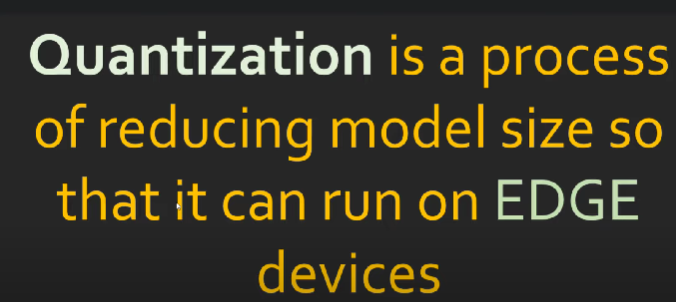

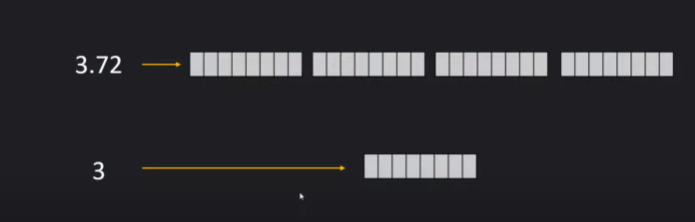

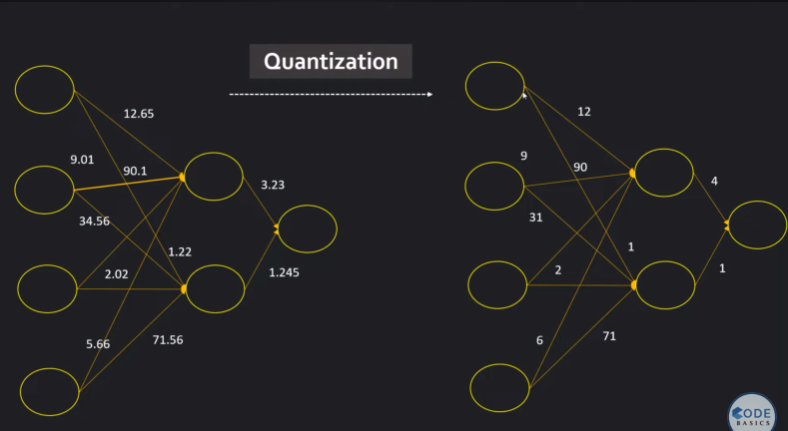

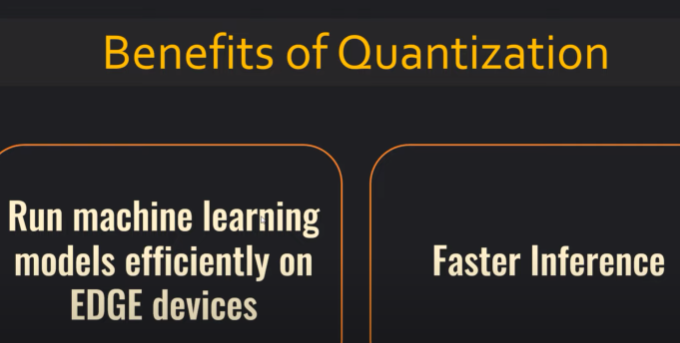

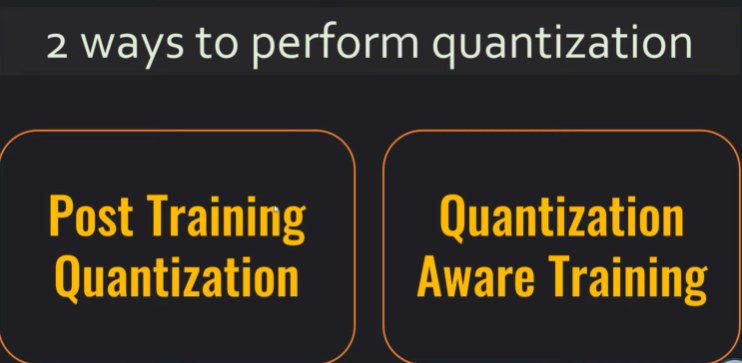

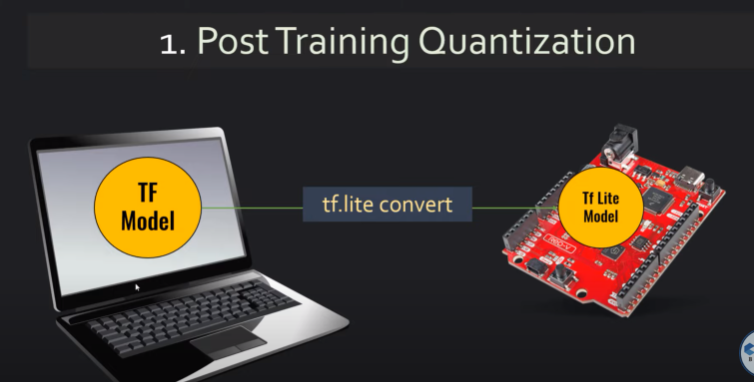

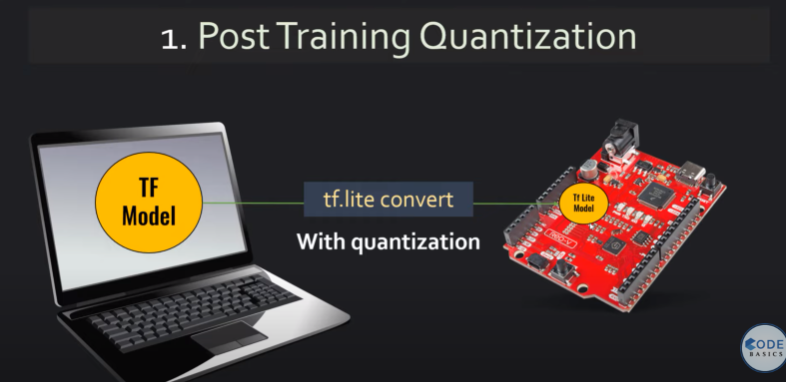

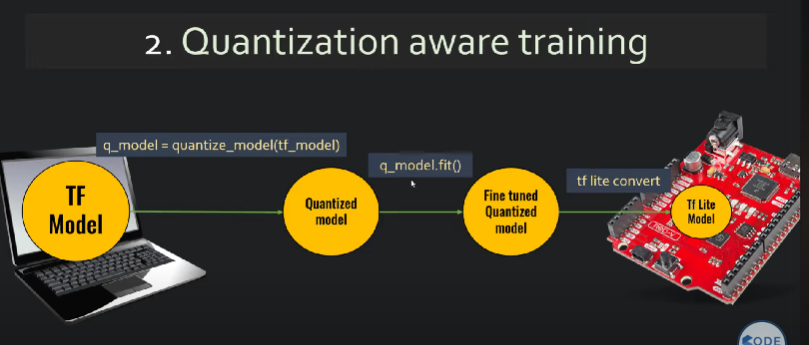

Quantisation aware training is more accurate.

In [123]:
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

In [124]:
(X_train, y_train) , (X_test, y_test) = keras.datasets.mnist.load_data()

In [125]:
len(X_train)

60000

In [126]:
len(X_test)

10000

In [127]:
X_train[0].shape

(28, 28)

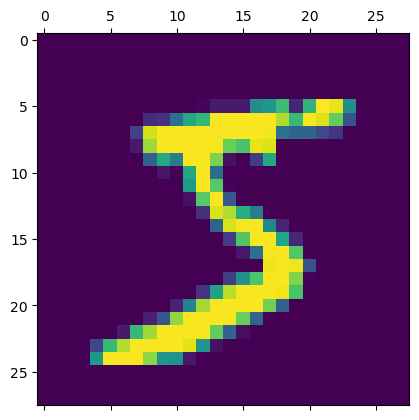

In [128]:
plt.matshow(X_train[0])

In [129]:
y_train[0]

5

In [130]:
X_train = X_train / 255
X_test = X_test / 255

In [131]:
X_train_flattened = X_train.reshape(len(X_train), 28*28)
X_test_flattened = X_test.reshape(len(X_test), 28*28)

In [132]:
X_train_flattened.shape

(60000, 784)

# Using Flatten layer so that we don't have to call .reshape on input dataset

In [133]:
model = keras.Sequential([
    keras.layers.Flatten(input_shape=(28, 28)),
    keras.layers.Dense(100, activation='relu'),
    keras.layers.Dense(10, activation='sigmoid')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(X_train, y_train, epochs=5)

Epoch 1/5
1875/1875 [==============================] - 2s 1ms/step - loss: 0.2786 - accuracy: 0.9204
Epoch 2/5
1875/1875 [==============================] - 2s 1ms/step - loss: 0.1245 - accuracy: 0.9631
Epoch 3/5
1875/1875 [==============================] - 2s 1ms/step - loss: 0.0866 - accuracy: 0.9748
Epoch 4/5
1875/1875 [==============================] - 2s 1ms/step - loss: 0.0654 - accuracy: 0.9800
Epoch 5/5
1875/1875 [==============================] - 2s 1ms/step - loss: 0.0509 - accuracy: 0.9842


In [134]:
model.evaluate(X_test,y_test)

313/313 [==============================] - 0s 935us/step - loss: 0.0838 - accuracy: 0.9744


[0.08383294194936752, 0.974399983882904]

In [135]:
model.save("./saved_model/")

INFO:tensorflow:Assets written to: ./saved_model/assets


INFO:tensorflow:Assets written to: ./saved_model/assets


# 1) Post training quantization

# Without quantization

In [136]:
converter = tf.lite.TFLiteConverter.from_saved_model("./saved_model")
tflite_model = converter.convert()

# With quantization

In [137]:
converter = tf.lite.TFLiteConverter.from_saved_model("./saved_model")
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_quant_model = converter.convert()

Read this article for post training quantization: https://www.tensorflow.org/model_optimization/guide/quantization/post_training

In [138]:
len(tflite_model)

320040

In [139]:
len(tflite_quant_model)

84912

You can see above that quantizated model is 1/4th the size of a non quantized model

In [140]:
with open("tflite_model.tflite", "wb") as f:
    f.write(tflite_model)

In [141]:
with open("tflite_quant_model.tflite", "wb") as f:
    f.write(tflite_quant_model)

Once you have above files saved to a disk, check their sizes. Quantized model will be obvi



# 2) Quantization aware training

In [143]:
pip install tensorflow-model-optimization


Defaulting to user installation because normal site-packages is not writeable
     -------------------------------------- 241.2/241.2 kB 2.5 MB/s eta 0:00:00
     ---------------------------------------- 101.3/101.3 kB ? eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [144]:
import tensorflow_model_optimization as tfmot

quantize_model = tfmot.quantization.keras.quantize_model

# q_aware stands for for quantization aware.
q_aware_model = quantize_model(model)

# `quantize_model` requires a recompile.
q_aware_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

q_aware_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 quantize_layer (QuantizeLay  (None, 28, 28)           3         
 er)                                                             
                                                                 
 quant_flatten_2 (QuantizeWr  (None, 784)              1         
 apperV2)                                                        
                                                                 
 quant_dense_2 (QuantizeWrap  (None, 100)              78505     
 perV2)                                                          
                                                                 
 quant_dense_3 (QuantizeWrap  (None, 10)               1015      
 perV2)                                                          
                                                                 
Total params: 79,524
Trainable params: 79,510
Non-trai

In [145]:
q_aware_model.fit(X_train, y_train, epochs=1)

1875/1875 [==============================] - 3s 1ms/step - loss: 0.0425 - accuracy: 0.9864


In [146]:
q_aware_model.evaluate(X_test, y_test)

313/313 [==============================] - 0s 1ms/step - loss: 0.0733 - accuracy: 0.9776


[0.07326079159975052, 0.9775999784469604]

In [147]:
converter = tf.lite.TFLiteConverter.from_keras_model(q_aware_model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]

tflite_qaware_model = converter.convert()

INFO:tensorflow:Assets written to: C:\Users\Ayush\AppData\Local\Temp\tmptp10c26p\assets


INFO:tensorflow:Assets written to: C:\Users\Ayush\AppData\Local\Temp\tmptp10c26p\assets
C:\ProgramData\anaconda3\lib\site-packages\tensorflow\lite\python\convert.py:766: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn("Statistics for quantized inputs were expected, but not "


In [148]:
len(tflite_qaware_model)

82776

In [149]:
with open("tflite_qaware_model.tflite", 'wb') as f:
    f.write(tflite_qaware_model)